# 1. Load Library and Load Dataset

In [1]:
# Library
import sys
import numpy as np # Linear Algebra
np.set_printoptions(threshold=sys.maxsize)
import pandas as pd # Data Processing, CSV file I/O (e.g. pd.read_csv)

# Library for data visualization
import matplotlib.pyplot as plt

# KMeans Clustering
from sklearn.cluster import KMeans

# Silhouette Coefficient
from sklearn.metrics import silhouette_score

# Preprocessing
from sklearn import preprocessing

In [2]:
# Reading Dataset
data_inventori = pd.read_excel("Dataset/Dataset18_Inventori.xlsx")

print('Dataset : ')
print(data_inventori)

Dataset : 
          Plu                      Description TAG  Bulan  Min Disp  Minor  \
0         234                   DJI SAM SOE 12   M     12         3      5   
1         246               GG PROFESSIONAL 16   M     12         3      5   
2         259               WISMILAK KRETEK 12   T     12         3      5   
3         275           LUCKY STRIKE FILTER 20   T     12         2      5   
4         320             LUCKY STRIKE COOL 20   P     12         2      5   
...       ...                              ...  ..    ...       ...    ...   
15499  990223     SUPER O2 SPORT WTR PET 600ML   B      2         2      2   
15500  990261  COCOBIT SPLASH LYCHEE PET 350ML   M      2         1      2   
15501  990291              COCA COLA PET 390ML   F      2         4     12   
15502  990292                 SPRITE PET 390ML   F      2         4     12   
15503  990293          FANTA STRAWBERRY PET 39   F      2         4     12   

       Sales  Avg Sales / Hari  MPKM Toko  PKM Toko 

# 2. Data Preprocessing

In [3]:
# To Show Dataset Information about Non Null and Null
print('Dataset Information : ')
data_inventori.info()

Dataset Information : 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15504 entries, 0 to 15503
Data columns (total 17 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Plu               15504 non-null  int64  
 1   Description       15504 non-null  object 
 2   TAG               15504 non-null  object 
 3   Bulan             15504 non-null  int64  
 4   Min Disp          15504 non-null  int64  
 5   Minor             15504 non-null  int64  
 6   Sales             15504 non-null  float64
 7   Avg Sales / Hari  15504 non-null  int64  
 8   MPKM Toko         15504 non-null  float64
 9   PKM Toko          15504 non-null  float64
 10  N+                15504 non-null  int64  
 11  Nx                15504 non-null  int64  
 12  PKM Exist         15504 non-null  float64
 13  Stock             15504 non-null  float64
 14  Stock Out         15504 non-null  int64  
 15  DSI PKM           15504 non-null  float64
 16  DSI OH           

In [4]:
# drop unwanted column
data_inventori.drop(['Nx'], axis=1, inplace=True)

In [5]:
# This is process of attributes allocation
data_inventori1 = data_inventori[['Sales', 'Stock Out', 'Stock', 'Avg Sales / Hari', 'Min Disp', 'Minor', 'MPKM Toko', 'PKM Toko', 'N+', 'DSI PKM', 'DSI OH', 'PKM Exist']]
data_inventori1

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist
0,19.0,0,23.0,1,3,5,12.0,27.0,0,54.0,46.000,27.0
1,2.0,0,11.0,0,3,5,8.0,8.0,0,171.0,235.000,8.0
2,0.0,0,7.0,0,3,5,8.0,8.0,0,0.0,0.000,8.0
3,4.0,0,19.0,0,2,5,15.0,15.0,0,74.0,94.000,15.0
4,4.0,0,21.0,0,2,5,8.0,8.0,0,128.0,336.000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.0,0,48.0,0,2,2,4.0,4.0,7,108.0,1.296,11.0
15500,0.0,0,9.0,0,1,2,5.0,5.0,4,135.0,243.000,9.0
15501,10.0,0,22.0,0,4,12,22.0,23.0,0,52.0,50.000,23.0
15502,45.0,0,34.0,1,4,12,28.0,37.0,0,26.0,24.000,37.0


In [6]:
# This is process of scaling data 
data_inventoriscaled = preprocessing.MinMaxScaler().fit_transform(data_inventori1)
data_inventoriscaled

array([[6.99300699e-03, 0.00000000e+00, 5.64001701e-02, 1.04166667e-02,
        6.00000000e-03, 2.50000000e-03, 4.80000000e-03, 7.10526316e-04,
        0.00000000e+00, 2.10937500e-04, 5.94334346e-04, 7.10526316e-04],
       [7.36105999e-04, 0.00000000e+00, 5.60812248e-02, 0.00000000e+00,
        6.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10526316e-04,
        0.00000000e+00, 6.67968750e-04, 1.06630574e-03, 2.10526316e-04],
       [0.00000000e+00, 0.00000000e+00, 5.59749096e-02, 0.00000000e+00,
        6.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10526316e-04,
        0.00000000e+00, 0.00000000e+00, 4.79463001e-04, 2.10526316e-04],
       [1.47221200e-03, 0.00000000e+00, 5.62938550e-02, 0.00000000e+00,
        4.00000000e-03, 2.50000000e-03, 6.00000000e-03, 3.94736842e-04,
        0.00000000e+00, 2.89062500e-04, 7.14200096e-04, 3.94736842e-04],
       [1.47221200e-03, 0.00000000e+00, 5.63470125e-02, 0.00000000e+00,
        4.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10

In [7]:
# This is process to change the Data to be Data Frame
data_inventori2 = pd.DataFrame(data_inventoriscaled, columns=data_inventori1.columns[:12])
data_inventori2

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist
0,0.006993,0.0,0.056400,0.010417,0.006,0.0025,0.0048,0.000711,0.000000,0.000211,0.000594,0.000711
1,0.000736,0.0,0.056081,0.000000,0.006,0.0025,0.0032,0.000211,0.000000,0.000668,0.001066,0.000211
2,0.000000,0.0,0.055975,0.000000,0.006,0.0025,0.0032,0.000211,0.000000,0.000000,0.000479,0.000211
3,0.001472,0.0,0.056294,0.000000,0.004,0.0025,0.0060,0.000395,0.000000,0.000289,0.000714,0.000395
4,0.001472,0.0,0.056347,0.000000,0.004,0.0025,0.0032,0.000211,0.000000,0.000500,0.001319,0.000211
...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.000000,0.0,0.057065,0.000000,0.004,0.0010,0.0016,0.000105,0.023026,0.000422,0.000483,0.000289
15500,0.000000,0.0,0.056028,0.000000,0.002,0.0010,0.0020,0.000132,0.013158,0.000527,0.001086,0.000237
15501,0.003681,0.0,0.056374,0.000000,0.008,0.0060,0.0088,0.000605,0.000000,0.000203,0.000604,0.000605
15502,0.016562,0.0,0.056693,0.010417,0.008,0.0060,0.0112,0.000974,0.000000,0.000102,0.000539,0.000974


# 3. Model Building

In [8]:
# This is Process to select the attributes 
X = data_inventori2[['Sales', 'Stock Out', 'Stock', 'Avg Sales / Hari', 'Min Disp', 'Minor', 'MPKM Toko', 'PKM Toko', 'N+', 'DSI PKM', 'DSI OH', 'PKM Exist' ]]
X

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist
0,0.006993,0.0,0.056400,0.010417,0.006,0.0025,0.0048,0.000711,0.000000,0.000211,0.000594,0.000711
1,0.000736,0.0,0.056081,0.000000,0.006,0.0025,0.0032,0.000211,0.000000,0.000668,0.001066,0.000211
2,0.000000,0.0,0.055975,0.000000,0.006,0.0025,0.0032,0.000211,0.000000,0.000000,0.000479,0.000211
3,0.001472,0.0,0.056294,0.000000,0.004,0.0025,0.0060,0.000395,0.000000,0.000289,0.000714,0.000395
4,0.001472,0.0,0.056347,0.000000,0.004,0.0025,0.0032,0.000211,0.000000,0.000500,0.001319,0.000211
...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.000000,0.0,0.057065,0.000000,0.004,0.0010,0.0016,0.000105,0.023026,0.000422,0.000483,0.000289
15500,0.000000,0.0,0.056028,0.000000,0.002,0.0010,0.0020,0.000132,0.013158,0.000527,0.001086,0.000237
15501,0.003681,0.0,0.056374,0.000000,0.008,0.0060,0.0088,0.000605,0.000000,0.000203,0.000604,0.000605
15502,0.016562,0.0,0.056693,0.010417,0.008,0.0060,0.0112,0.000974,0.000000,0.000102,0.000539,0.000974


In [9]:
# This is process to change the data on testing to array
data_inventori1numpy = data_inventori1.to_numpy()
data_inventori1numpy

array([[ 1.90000e+01,  0.00000e+00,  2.30000e+01,  1.00000e+00,
         3.00000e+00,  5.00000e+00,  1.20000e+01,  2.70000e+01,
         0.00000e+00,  5.40000e+01,  4.60000e+01,  2.70000e+01],
       [ 2.00000e+00,  0.00000e+00,  1.10000e+01,  0.00000e+00,
         3.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  1.71000e+02,  2.35000e+02,  8.00000e+00],
       [ 0.00000e+00,  0.00000e+00,  7.00000e+00,  0.00000e+00,
         3.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  0.00000e+00,  0.00000e+00,  8.00000e+00],
       [ 4.00000e+00,  0.00000e+00,  1.90000e+01,  0.00000e+00,
         2.00000e+00,  5.00000e+00,  1.50000e+01,  1.50000e+01,
         0.00000e+00,  7.40000e+01,  9.40000e+01,  1.50000e+01],
       [ 4.00000e+00,  0.00000e+00,  2.10000e+01,  0.00000e+00,
         2.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  1.28000e+02,  3.36000e+02,  8.00000e+00],
       [ 0.00000e+00,  3.10000e+01,

In [10]:
# Define 2 variable for describing the maximum and the minimum of data
mn = np.min(data_inventori1numpy, axis=0)  
mx = np.max(data_inventori1numpy, axis=0)  

In [11]:
# This is process to change the data on testing to array
data_inventori2numpy = data_inventori2.to_numpy()
data_inventori2numpy

array([[6.99300699e-03, 0.00000000e+00, 5.64001701e-02, 1.04166667e-02,
        6.00000000e-03, 2.50000000e-03, 4.80000000e-03, 7.10526316e-04,
        0.00000000e+00, 2.10937500e-04, 5.94334346e-04, 7.10526316e-04],
       [7.36105999e-04, 0.00000000e+00, 5.60812248e-02, 0.00000000e+00,
        6.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10526316e-04,
        0.00000000e+00, 6.67968750e-04, 1.06630574e-03, 2.10526316e-04],
       [0.00000000e+00, 0.00000000e+00, 5.59749096e-02, 0.00000000e+00,
        6.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10526316e-04,
        0.00000000e+00, 0.00000000e+00, 4.79463001e-04, 2.10526316e-04],
       [1.47221200e-03, 0.00000000e+00, 5.62938550e-02, 0.00000000e+00,
        4.00000000e-03, 2.50000000e-03, 6.00000000e-03, 3.94736842e-04,
        0.00000000e+00, 2.89062500e-04, 7.14200096e-04, 3.94736842e-04],
       [1.47221200e-03, 0.00000000e+00, 5.63470125e-02, 0.00000000e+00,
        4.00000000e-03, 2.50000000e-03, 3.20000000e-03, 2.10

In [12]:
# This is process to return data to be as before
data_inventori2 = (data_inventori2numpy * (mx - mn)) + mn
data_inventori2

array([[ 1.90000e+01,  0.00000e+00,  2.30000e+01,  1.00000e+00,
         3.00000e+00,  5.00000e+00,  1.20000e+01,  2.70000e+01,
         0.00000e+00,  5.40000e+01,  4.60000e+01,  2.70000e+01],
       [ 2.00000e+00,  0.00000e+00,  1.10000e+01,  0.00000e+00,
         3.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  1.71000e+02,  2.35000e+02,  8.00000e+00],
       [ 0.00000e+00,  0.00000e+00,  7.00000e+00,  0.00000e+00,
         3.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  0.00000e+00,  0.00000e+00,  8.00000e+00],
       [ 4.00000e+00,  0.00000e+00,  1.90000e+01,  0.00000e+00,
         2.00000e+00,  5.00000e+00,  1.50000e+01,  1.50000e+01,
         0.00000e+00,  7.40000e+01,  9.40000e+01,  1.50000e+01],
       [ 4.00000e+00,  0.00000e+00,  2.10000e+01,  0.00000e+00,
         2.00000e+00,  5.00000e+00,  8.00000e+00,  8.00000e+00,
         0.00000e+00,  1.28000e+02,  3.36000e+02,  8.00000e+00],
       [ 0.00000e+00,  3.10000e+01,

In [13]:
# This is process to change the data tobe a dataframe
data_inventori2 = pd.DataFrame(data_inventori2, columns=data_inventori1.columns[:12])
data_inventori2

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist
0,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0
1,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0
2,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0
3,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0
4,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0
15500,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0
15501,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0
15502,45.0,0.0,34.0,1.0,4.0,12.0,28.0,37.0,0.0,26.0,24.000,37.0


In [14]:
# This is process to build model for k equals to 3
model = KMeans(n_clusters=3, init = 'k-means++', random_state=42)
# fit the model
model.fit(X)

KMeans(n_clusters=3, random_state=42)

In [15]:
# This is process to predict the values
y_predicted = model.fit_predict(X)

In [16]:
# This is process to add the new column to the dataframe
data_inventori2['Cluster'] = y_predicted
# display the dataframe
data_inventori2

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
0,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0
15502,45.0,0.0,34.0,1.0,4.0,12.0,28.0,37.0,0.0,26.0,24.000,37.0,0


In [17]:
# This is to show the Centers of Clusters
model.cluster_centers_

array([[2.24195917e-03, 5.51531259e-03, 5.61501346e-02, 1.47620864e-03,
        5.54819602e-03, 1.91599354e-03, 3.18724179e-03, 3.49780111e-04,
        7.95620412e-03, 4.69550565e-04, 8.78751497e-04, 4.13321099e-04],
       [9.07963911e-05, 9.64599810e-01, 5.64067066e-02, 4.50364530e-05,
        8.48880977e-03, 6.22863683e-03, 7.52602238e-03, 1.20749451e-03,
        9.82993789e-04, 5.55384654e-05, 4.85968195e-04, 1.21535846e-03],
       [2.14925833e-03, 4.09827457e-01, 5.59273862e-02, 1.01744186e-03,
        5.43255814e-03, 2.54767442e-03, 4.06046512e-03, 2.98898409e-04,
        3.84026928e-03, 2.67627026e-04, 5.94367100e-04, 3.29620563e-04]])

In [18]:
# get all the values
X = X.values

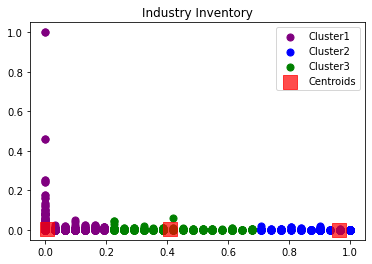

In [19]:
# Visualizing the clusters for k equals to 3

plt.scatter(X[y_predicted==0,1],X[y_predicted==0,0],s=50, c='purple',label='Cluster1')
plt.scatter(X[y_predicted==1,1],X[y_predicted==1,0],s=50, c='blue',label='Cluster2')
plt.scatter(X[y_predicted==2,1],X[y_predicted==2,0],s=50, c='green',label='Cluster3')

plt.scatter(model.cluster_centers_[:,1],model.cluster_centers_[:,0], s=200,marker='s', c='red', alpha=0.7, label='Centroids')
plt.title('Industry Inventory')
plt.legend()
plt.show()

In [20]:
# To show all Data in the cluster 0
kluster0 = data_inventori2[data_inventori2["Cluster"]==0]
kluster0

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
0,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0
15502,45.0,0.0,34.0,1.0,4.0,12.0,28.0,37.0,0.0,26.0,24.000,37.0,0


In [21]:
# To show all Data in the cluster 1
kluster1 = data_inventori2[data_inventori2["Cluster"]==1]
kluster1

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
5,0.0,31.0,0.0,0.0,0.0,200.0,400.0,1700.0,0.0,0.0,0.0,1700.0,1
6,0.0,31.0,0.0,0.0,0.0,100.0,200.0,1180.0,0.0,0.0,0.0,1180.0,1
10,0.0,31.0,12.0,0.0,1.0,6.0,9.0,9.0,0.0,0.0,0.0,9.0,1
13,0.0,31.0,0.0,0.0,2.0,6.0,9.0,9.0,0.0,0.0,0.0,9.0,1
14,0.0,31.0,6.0,0.0,2.0,6.0,9.0,9.0,0.0,0.0,0.0,9.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15474,1.0,27.0,0.0,0.0,0.0,10.0,20.0,20.0,0.0,810.0,0.0,20.0,1
15475,9.0,24.0,0.0,0.0,0.0,10.0,20.0,20.0,0.0,162.0,0.0,20.0,1
15479,0.0,28.0,0.0,0.0,0.0,3.0,5.0,5.0,0.0,0.0,0.0,5.0,1
15480,0.0,28.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1


In [22]:
# To show all Data in the cluster 2
kluster2 = data_inventori2[data_inventori2["Cluster"]==2]
kluster2

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
47,3.0,8.0,5.0,0.0,3.0,2.0,5.0,5.0,0.0,40.0,40.0,5.0,2
51,5.0,7.0,3.0,0.0,3.0,2.0,5.0,5.0,0.0,20.0,12.0,5.0,2
77,3.0,8.0,4.0,0.0,2.0,1.0,3.0,3.0,0.0,64.0,85.0,3.0,2
254,7.0,7.0,0.0,0.0,2.0,12.0,15.0,18.0,12.0,50.0,0.0,30.0,2
319,8.0,21.0,2.0,0.0,2.0,5.0,9.0,9.0,0.0,32.0,7.0,9.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15082,0.0,12.0,3.0,0.0,2.0,1.0,3.0,3.0,0.0,0.0,0.0,3.0,2
15179,7.0,12.0,1.0,0.0,2.0,7.0,15.0,15.0,0.0,58.0,4.0,15.0,2
15478,0.0,12.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,2
15481,0.0,10.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,2


In [23]:
# serializing our model to a file called model.pkl
import pickle
pickle.dump(model, open("model.pkl","wb"))

# 4. Model Evaluation

In [24]:
# To show score of Silhouette Coefficient
silhouette_score(X, model.labels_)

0.8975411601408748

# 5. Export Data

In [27]:
# Agregasi Data
data_inventoris1 = data_inventori[['Plu', 'Description','TAG']]
data_inventoris1

,Plu,Description,TAG
0,234,DJI SAM SOE 12,M
1,246,GG PROFESSIONAL 16,M
2,259,WISMILAK KRETEK 12,T
3,275,LUCKY STRIKE FILTER 20,T
4,320,LUCKY STRIKE COOL 20,P
...,...,...,...
15499,990223,SUPER O2 SPORT WTR PET 600ML,B
15500,990261,COCOBIT SPLASH LYCHEE PET 350ML,M
15501,990291,COCA COLA PET 390ML,F
15502,990292,SPRITE PET 390ML,F


In [28]:
data_inventoris1.insert(0,'No',range(0,0+len(data_inventoris1)))
data_inventoris1

,No,Plu,Description,TAG
0,0,234,DJI SAM SOE 12,M
1,1,246,GG PROFESSIONAL 16,M
2,2,259,WISMILAK KRETEK 12,T
3,3,275,LUCKY STRIKE FILTER 20,T
4,4,320,LUCKY STRIKE COOL 20,P
...,...,...,...,...
15499,15499,990223,SUPER O2 SPORT WTR PET 600ML,B
15500,15500,990261,COCOBIT SPLASH LYCHEE PET 350ML,M
15501,15501,990291,COCA COLA PET 390ML,F
15502,15502,990292,SPRITE PET 390ML,F


In [29]:
data_inventoris1.set_index('No')

,Plu,Description,TAG
No,,,
0,234,DJI SAM SOE 12,M
1,246,GG PROFESSIONAL 16,M
2,259,WISMILAK KRETEK 12,T
3,275,LUCKY STRIKE FILTER 20,T
4,320,LUCKY STRIKE COOL 20,P
...,...,...,...
15499,990223,SUPER O2 SPORT WTR PET 600ML,B
15500,990261,COCOBIT SPLASH LYCHEE PET 350ML,M
15501,990291,COCA COLA PET 390ML,F


In [31]:
data_inventori2.insert(0,'No',range(0,0+len(data_inventori2)))
data_inventori2

,No,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
0,0,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,1,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,2,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,3,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,4,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,15499,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,15500,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,15501,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0
15502,15502,45.0,0.0,34.0,1.0,4.0,12.0,28.0,37.0,0.0,26.0,24.000,37.0,0


In [33]:
data_inventori2.set_index('No')

,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
No,,,,,,,,,,,,,
0,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0


In [34]:
data_inventorifinals = pd.merge(data_inventoris1, data_inventori2, on='No')
data_inventorifinals

,No,Plu,Description,TAG,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
0,0,234,DJI SAM SOE 12,M,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,1,246,GG PROFESSIONAL 16,M,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,2,259,WISMILAK KRETEK 12,T,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,3,275,LUCKY STRIKE FILTER 20,T,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,4,320,LUCKY STRIKE COOL 20,P,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,15499,990223,SUPER O2 SPORT WTR PET 600ML,B,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,15500,990261,COCOBIT SPLASH LYCHEE PET 350ML,M,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,15501,990291,COCA COLA PET 390ML,F,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0
15502,15502,990292,SPRITE PET 390ML,F,45.0,0.0,34.0,1.0,4.0,12.0,28.0,37.0,0.0,26.0,24.000,37.0,0


In [35]:
data_inventorifinals.set_index('No')

,Plu,Description,TAG,Sales,Stock Out,Stock,Avg Sales / Hari,Min Disp,Minor,MPKM Toko,PKM Toko,N+,DSI PKM,DSI OH,PKM Exist,Cluster
No,,,,,,,,,,,,,,,,
0,234,DJI SAM SOE 12,M,19.0,0.0,23.0,1.0,3.0,5.0,12.0,27.0,0.0,54.0,46.000,27.0,0
1,246,GG PROFESSIONAL 16,M,2.0,0.0,11.0,0.0,3.0,5.0,8.0,8.0,0.0,171.0,235.000,8.0,0
2,259,WISMILAK KRETEK 12,T,0.0,0.0,7.0,0.0,3.0,5.0,8.0,8.0,0.0,0.0,0.000,8.0,0
3,275,LUCKY STRIKE FILTER 20,T,4.0,0.0,19.0,0.0,2.0,5.0,15.0,15.0,0.0,74.0,94.000,15.0,0
4,320,LUCKY STRIKE COOL 20,P,4.0,0.0,21.0,0.0,2.0,5.0,8.0,8.0,0.0,128.0,336.000,8.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15499,990223,SUPER O2 SPORT WTR PET 600ML,B,0.0,0.0,48.0,0.0,2.0,2.0,4.0,4.0,7.0,108.0,1.296,11.0,0
15500,990261,COCOBIT SPLASH LYCHEE PET 350ML,M,0.0,0.0,9.0,0.0,1.0,2.0,5.0,5.0,4.0,135.0,243.000,9.0,0
15501,990291,COCA COLA PET 390ML,F,10.0,0.0,22.0,0.0,4.0,12.0,22.0,23.0,0.0,52.0,50.000,23.0,0


In [37]:
# To Export Data
data_inventorifinals.to_excel("Dataset/HasilKlusterFinal.xlsx", index=False)